# `dtreeviz` Explaining Facebook Engagement


## Setup

In [1]:
import sys
import os
import sys

if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")

In [2]:
%config InlineBackend.figure_format = 'retina' # Make visualizations look good
#%config InlineBackend.figure_format = 'svg'
%matplotlib inline

if 'google.colab' in sys.modules:
  !pip install -q dtreeviz
  !pip install -q xgboost==1.5.0

In [3]:
import xgboost as xgb
from xgboost import plot_importance, plot_tree, plotting

import dtreeviz
import graphviz
import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams

import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
import logging
logging.getLogger('matplotlib.font_manager').setLevel(level=logging.CRITICAL)

random_state = 1234 # get reproducible trees

## Load Sample Data

In [5]:
new_dataset_url = "https://raw.githubusercontent.com/datajour-gr/iqjournalism/main/sample_data/koinonia_politiki_features_fb.csv"
dataset = pd.read_csv(new_dataset_url)

In [8]:
dataset = dataset.dropna()
dataset.shape

(37051, 52)

In [11]:
dataset.replace([np.inf, -np.inf], np.nan, inplace=True)
dataset.dropna(inplace=True)

In [12]:
dataset.replace([np.inf, -np.inf], np.nan, inplace=True)

In [13]:
dataset[dataset==np.inf]=np.nan
dataset.fillna(dataset.mean(), inplace=True)

In [14]:
dataset['Likes'].describe([.80, .90, .91, .95])

count    37051.000000
mean        36.780519
std        159.922642
min          0.000000
50%          9.000000
80%         32.000000
90%         63.000000
91%         70.000000
95%        124.500000
max       6260.000000
Name: Likes, dtype: float64

In [15]:
dataset['Likes'].describe([.20, .15, .10, .05])

count    37051.000000
mean        36.780519
std        159.922642
min          0.000000
5%           1.000000
10%          1.000000
15%          2.000000
20%          3.000000
50%          9.000000
max       6260.000000
Name: Likes, dtype: float64

In [16]:
dataset[dataset['Likes'] >=70].shape

(3370, 52)

In [17]:
data_good = dataset[dataset['Likes'] >=70]
data_good.shape

(3370, 52)

In [18]:
data_good['engagement'] = 1

In [19]:
data_bad = dataset[dataset['Likes'] <=1] 
data_bad.shape

(3828, 52)

In [20]:
data_bad['engagement'] = 0

In [21]:
pdList = [data_bad, data_good]  # List of your dataframes
dataset= pd.concat(pdList)

In [22]:
dataset = dataset.reset_index(drop=True)

In [24]:
dataset.drop([' weaksubj', 'flesch_reading_ease','n_stop_words','MTLD', 'Nouns', 'Verbs', 'WeakSTitle','Likes'],axis=1, inplace=True)

In [25]:
dataset.tail()

,#title_words,Followers at Posting,Total Interactions,Comments,Shares,Love,Wow,Haha,Sad,Angry,...,animal,crime,caps_body,numbers,urls,sensual,special_char_ratio,strongsubjTitle,special_char_title,engagement
7193,14,299445.0,424,135.0,5.0,9.0,4.0,168.0,0.0,13.0,...,2,0,0,3,0,5,2.272727,0.0,0.227273,1
7194,20,299526.0,173,30.0,0.0,13.0,1.0,38.0,0.0,2.0,...,0,1,0,1,0,0,7.119741,0.0,0.647249,1
7195,14,299555.0,621,150.0,6.0,4.0,2.0,365.0,3.0,14.0,...,0,0,0,0,0,0,6.818182,0.0,1.136364,1
7196,12,299613.0,160,28.0,4.0,2.0,0.0,39.0,0.0,0.0,...,0,0,0,4,0,0,3.016241,0.0,0.696056,1
7197,15,299613.0,209,41.0,1.0,13.0,1.0,67.0,0.0,1.0,...,0,0,0,0,0,0,12.903226,0.0,0.537634,1


# Classifiers

To demonstrate classifier decision trees, we trying to model using six features to predict the boolean survived target.

In [26]:
from sklearn.model_selection import train_test_split

predictors = dataset.drop("engagement",axis=1)
target = dataset["engagement"]

X_train,X_test,Y_train,Y_test = train_test_split(predictors,target,test_size=0.20,random_state=0)

In [27]:
import xgboost as xgb

xgb_model = xgb.XGBClassifier(objective="binary:logistic", random_state=42, eval_metric="auc")
xgb_model.fit(X_train, Y_train, early_stopping_rounds=5, eval_set=[(X_test, Y_test)])

Y_pred_xgb = xgb_model.predict(X_test)

[0]	validation_0-auc:1.00000
[1]	validation_0-auc:1.00000
[2]	validation_0-auc:1.00000
[3]	validation_0-auc:1.00000
[4]	validation_0-auc:1.00000
[5]	validation_0-auc:1.00000


print("best score: {0}, best iteration: {1}".format(xgb_model.best_score, xgb_model.best_iteration))

In [28]:
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import confusion_matrix, f1_score
f1_score(Y_test, Y_pred_xgb, average='weighted')

1.0

In [29]:
features = ['#title_words', 'anger', 'anticipation', 'disgust', 'fear', 'joy', 'negative',
       'positive', 'sadness', 'surprise', 'trust', 'valence', 'arousal',
       'dominance', 'strongsubj', #' weaksubj', 'flesch_reading_ease',
       'flesch_kincaid_grade', 'mean_word_length', #'n_stop_words', 
            'sources',
       'length', #'MTLD', #'Nouns', 'Verbs', 
            'Adjectives', 'Anger_intensity',
       'Joy_intensity', 'Sadness_intensity', 'Fear_intensity', 'No Celebs',
       'animal', 'crime', 'caps_body', 'numbers', 'urls', 'special_char_ratio', 'strongsubjTitle', 
       'special_char_title']
target = "engagement"

dtrain = xgb.DMatrix(dataset[features], dataset[target])

params = {"max_depth":3, "eta":0.05, "objective":"binary:logistic", "subsample":1}
xgb_model = xgb.train(params=params, dtrain=dtrain, num_boost_round=8)

score_xgb = round(accuracy_score(Y_pred_xgb,Y_test)*100,2)

print("The accuracy score achieved using XGBoost is: "+str(score_xgb)+" %")

In [30]:
#CM

In [31]:
X_train,X_test,Y_train,Y_test = train_test_split(dataset[features],dataset["engagement"],test_size=0.20,random_state=0)

In [32]:
xgb_model = xgb.XGBClassifier(max_depth=5,  n_estimators = 40, objective= "binary:logistic",  random_state=42, eval_metric="auc")

xgb_model.fit(X_train, Y_train)#, early_stopping_rounds=5, eval_set=[(X_test, Y_test)])

Y_pred_xgb = xgb_model.predict(X_test)

In [33]:
score_xgb = round(accuracy_score(Y_pred_xgb,Y_test)*100,2)

print("The accuracy score achieved using XGBoost is: "+str(score_xgb)+" %")

The accuracy score achieved using XGBoost is: 65.0 %


In [34]:
f1_score(Y_test, Y_pred_xgb, average='weighted')

0.6485269360269359

## Initialize dtreeviz model (adaptor)

To adapt dtreeviz to a specific model, use the `model()` function to get an adaptor.  You'll need to provide the model, X/y data, feature names, target name, and target class names:

In [35]:
viz_model = dtreeviz.model(xgb_model, tree_index=1,
                           X_train=dataset[features], y_train=dataset[target],
                           feature_names=features,
                           target_name=target, class_names=["not engaging", "engaging"])

We'll use this model to demonstrate dtreeviz functionality in the following sections; the code will look the same for any decision tree library once we have this model adaptor.m

## Tree structure visualizations

To show the decision tree structure using the default visualization, call `view()`:

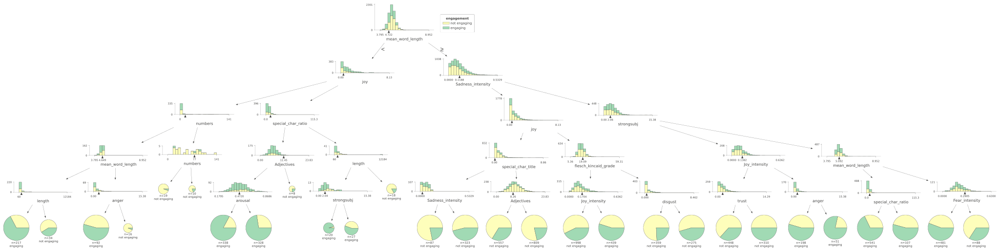

In [48]:
viz_model.view()

In [49]:
v = viz_model.view() 
v.save("XGBoosttreeEngagement_ks140224.svg")

To change the visualization, you can pass parameters, such as changing the orientation to left-to-right:

In [50]:
#viz_model.view(orientation="LR")

To visualize larger trees, you can reduce the amount of detail by turning off the fancy view:

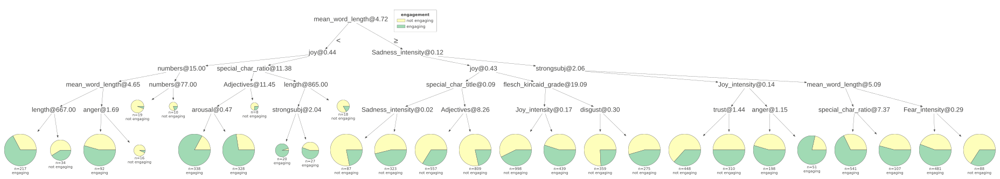

In [51]:
viz_model.view(fancy=False)

In [52]:
v = viz_model.view(fancy=False) 
v.save("XGBoosttreeEngagement_NonFancy_ks140224.svg")

Another way to reduce the visualization size is to specify the tree depths of interest:

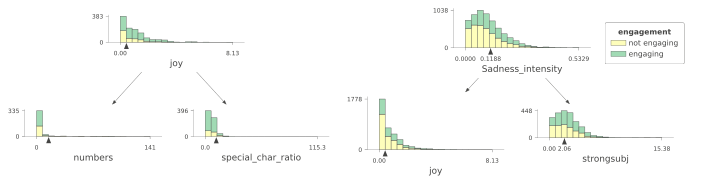

In [53]:
viz_model.view(depth_range_to_display=(1, 2, 3)) # root is level 0

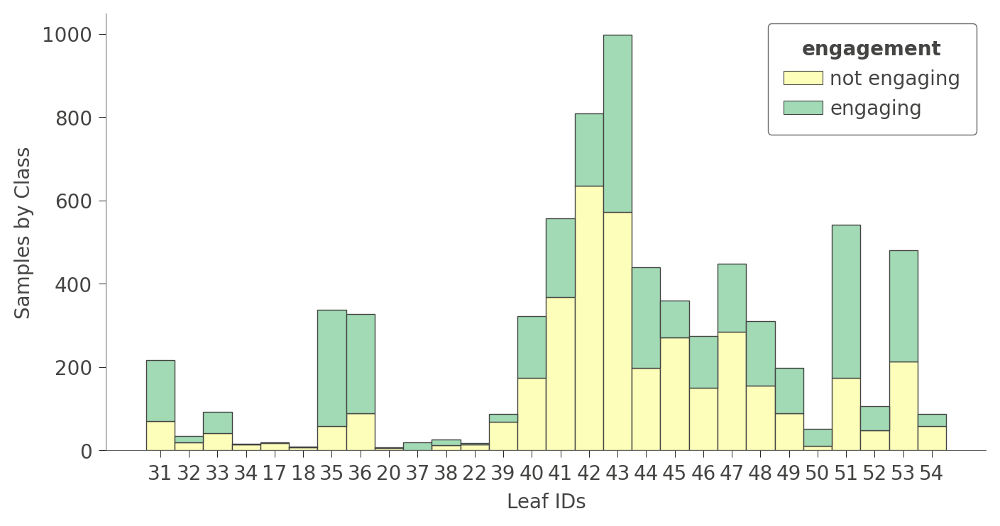

In [54]:
viz_model.ctree_leaf_distributions(figsize=(8,4))

## Prediction path explanations

For interpretation purposes, we often want to understand how a tree behaves for a specific instance. Let's pick a specific instance:

In [55]:
x = dataset[features].iloc[10]
x

#title_words              4.000000
anger                     2.090592
anticipation              1.393728
disgust                   0.000000
fear                      2.439024
joy                       0.348432
negative                  3.135889
positive                  1.742160
sadness                   1.742160
surprise                  0.696864
trust                     0.348432
valence                   0.455029
arousal                   0.456589
dominance                 0.477194
strongsubj                1.045296
flesch_kincaid_grade     19.480699
mean_word_length          5.476099
sources                   0.000000
length                  465.000000
Adjectives                7.956989
Anger_intensity           0.124143
Joy_intensity             0.107929
Sadness_intensity         0.170871
Fear_intensity            0.195986
No Celebs                 0.000000
animal                    0.000000
crime                     2.000000
caps_body                 0.000000
numbers             

and then display the path through the tree structure:

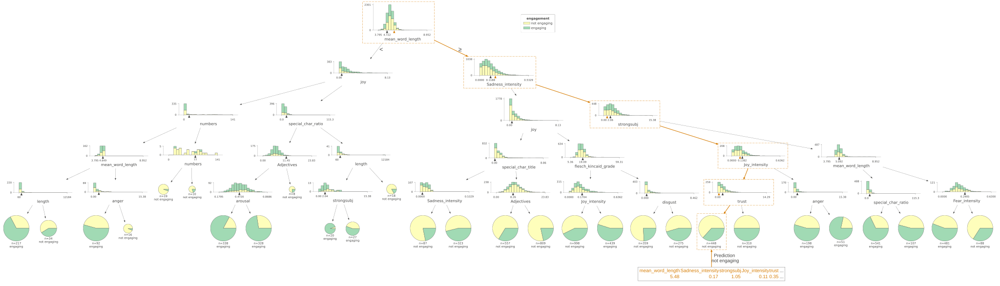

In [56]:
viz_model.view(x=x)

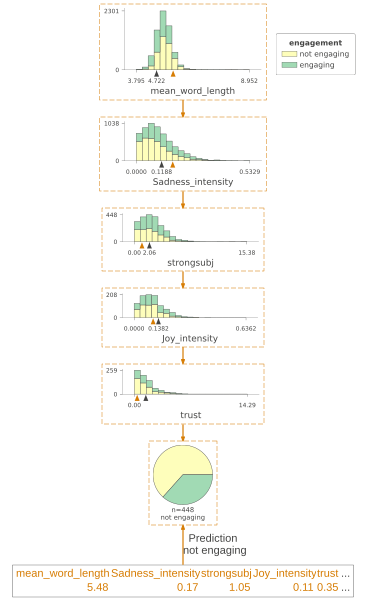

In [57]:
viz_model.view(x=x, show_just_path=True)

You can also get a string representation explaining the comparisons made as an instance is run down the tree:

In [58]:
print(viz_model.explain_prediction_path(x))

trust < 1.44
strongsubj < 2.06
4.72 <= mean_word_length 
Joy_intensity < 0.14
0.12 <= Sadness_intensity 



## Leaf info

There are a number of functions to get information about the leaves of the tree.

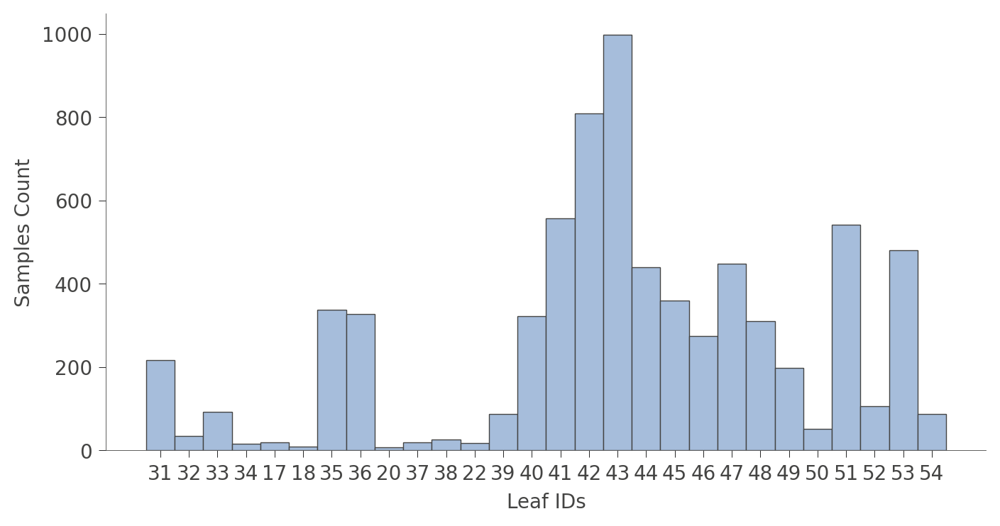

In [59]:
viz_model.leaf_sizes(figsize=(8,4))

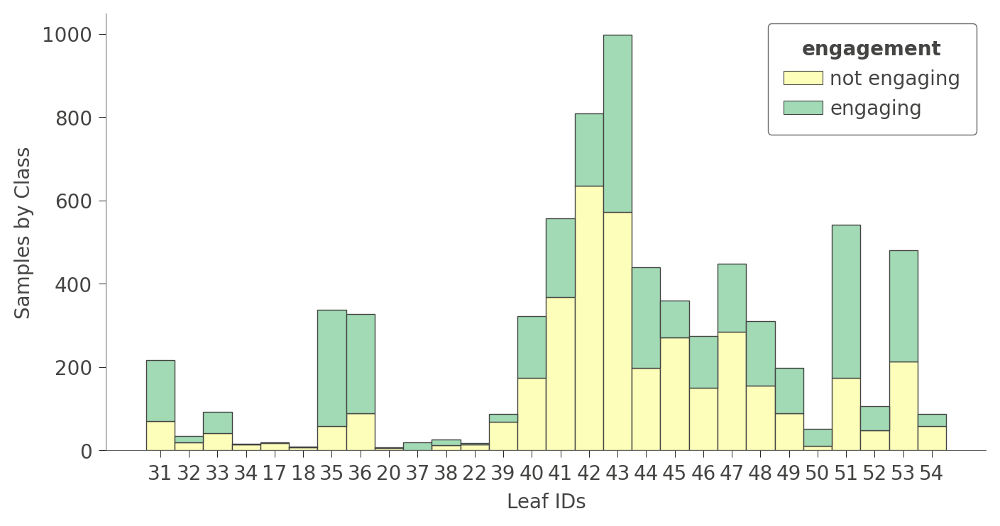

In [60]:
viz_model.ctree_leaf_distributions(figsize=(8,4))

In [61]:
viz_model.node_stats(node_id=10)

,#title_words,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,...,Fear_intensity,No Celebs,animal,crime,caps_body,numbers,urls,special_char_ratio,strongsubjTitle,special_char_title
count,65.0,65.0,65.0,65.0,65.0,65.0,65.0,65.0,65.0,65.0,...,65.0,65.0,65.0,65.0,65.0,65.0,65.0,65.0,65.0,65.0
mean,14.415385,1.130079,1.55588,0.605017,1.480423,1.416573,2.478785,3.348671,1.447234,0.710572,...,0.119712,0.538462,0.461538,0.738462,0.107692,3.876923,0.092308,14.88617,0.966812,0.876778
std,3.96032,0.985831,0.811081,0.661988,1.018935,0.925182,1.552357,1.49257,1.065279,0.599671,...,0.068717,1.105058,1.275697,1.779018,0.40012,6.462652,0.551222,3.215288,2.992747,0.884306
min,5.0,0.0,0.0,0.0,0.0,0.46729,0.0,0.657895,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.423221,0.0,0.0
25%,12.0,0.371747,1.111111,0.0,0.625,0.840336,1.395349,2.325581,0.641849,0.273973,...,0.072553,0.0,0.0,0.0,0.0,0.0,0.0,12.700535,0.0,0.235849
50%,15.0,0.943396,1.435407,0.4662,1.481481,1.217039,2.479339,3.183521,1.25,0.606061,...,0.120097,0.0,0.0,0.0,0.0,2.0,0.0,13.888889,0.0,0.60241
75%,17.0,1.728395,2.0,0.921659,2.173913,1.652893,3.338898,4.144385,2.222222,0.987654,...,0.161625,1.0,0.0,1.0,0.0,5.0,0.0,16.0,0.0,1.388889
max,23.0,4.6875,4.242424,2.597403,3.896104,5.309735,6.076389,8.80829,4.237288,2.597403,...,0.282324,6.0,8.0,9.0,2.0,41.0,4.0,28.438228,20.27027,4.0


In [60]:
import eli5

2024-02-14 15:21:30.282680: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-02-14 15:21:30.314637: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-02-14 15:21:30.315110: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-14 15:21:30.919680: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [63]:
eli5.show_weights(xgb_model, top = 12,feature_names = features)

Weight,Feature
0.0712,No Celebs
0.0601,mean_word_length
0.0507,Sadness_intensity
0.0487,urls
0.0416,joy
0.0366,sadness
0.0325,Joy_intensity
0.0311,animal
0.0307,disgust
0.0305,length


In [67]:
#Decision Trees

In [61]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

In [69]:
dt_model = DecisionTreeClassifier(max_depth=7, min_samples_split = 350, min_samples_leaf= 120) #class_weight='balanced') # Set max_depth & class_weight 
dt_model.fit(X_train, Y_train)

Y_pred_dt = dt_model.predict(X_test)


In [70]:
score_dt = round(accuracy_score(Y_pred_dt,Y_test)*100,2)

print("The accuracy score achieved using DTrees is: "+str(score_dt)+" %")

The accuracy score achieved using DTrees is: 60.69 %


In [71]:
f1_score(Y_test, Y_pred_dt, average='weighted')

0.5988335570914756

In [72]:
viz_model = dtreeviz.model(dt_model,
                           X_train=dataset[features], y_train=dataset[target],
                           feature_names=features,
                           target_name=target, class_names=["not engaging", "engaging"])

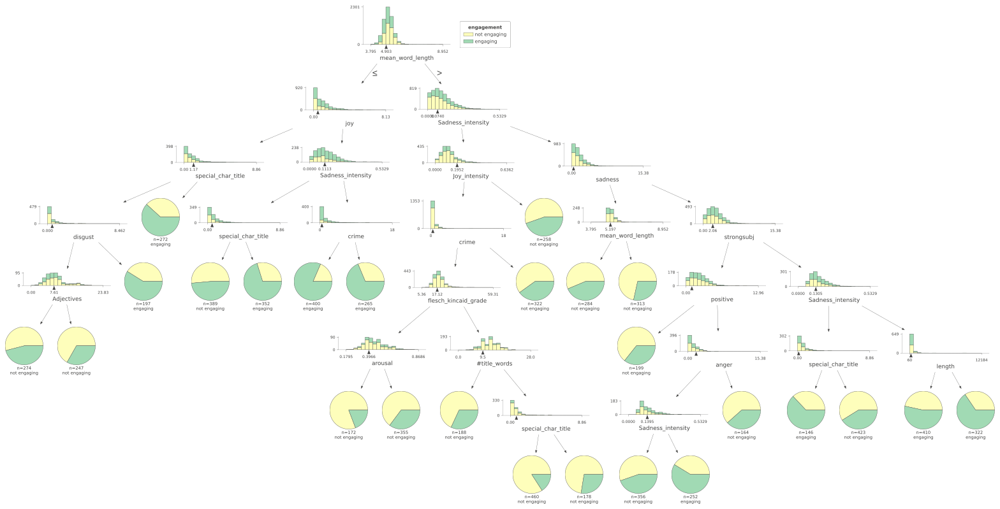

In [73]:
viz_model.view() 

In [ ]:
v = viz_model.view() 
v.save("DtreeEngagement_cm120224.svg")

In [ ]:
v = viz_model.view(fancy=False) 
v.save("DtreeEngagement_NonFancy_cm120224.svg")

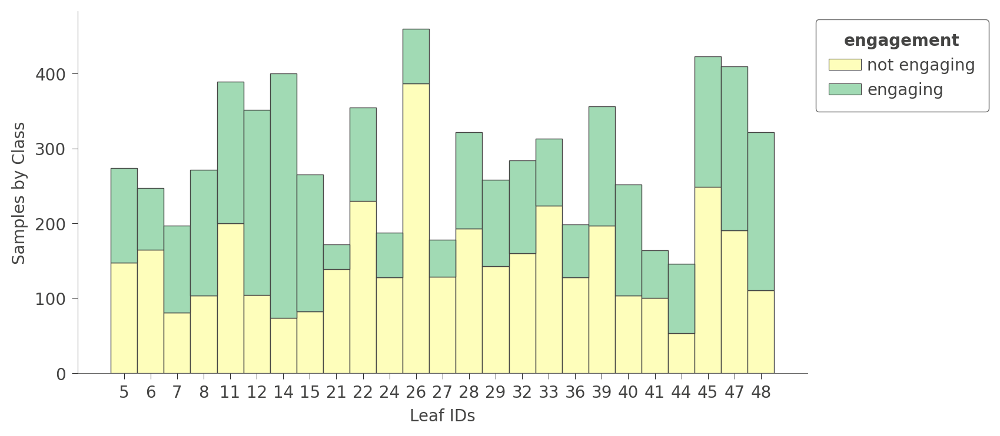

In [76]:
viz_model.ctree_leaf_distributions(figsize=(8,4))

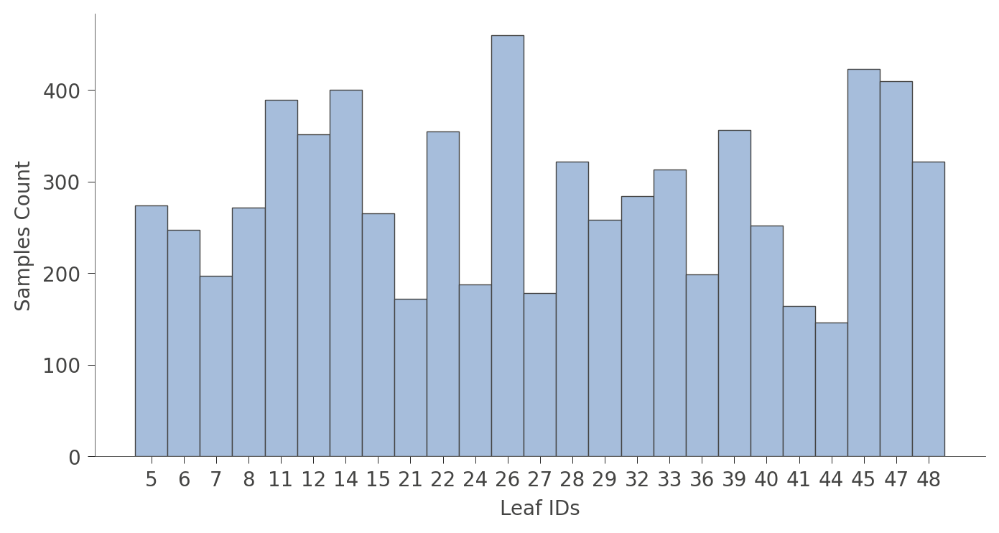

In [77]:
viz_model.leaf_sizes(figsize=(8,4))

In [78]:
# DT Regressor

In [605]:
dataset_url = "https://raw.githubusercontent.com/datajour-gr/iqjournalism/main/sample_data/high_final_all"
dataset2 = pd.read_csv(dataset_url)


In [607]:
dataset2 = dataset2.dropna()
dataset2.shape

(37051, 50)

In [608]:
dataset2.replace([np.inf, -np.inf], np.nan, inplace=True)
dataset2.dropna(inplace=True)

In [609]:
dataset2.shape

(37051, 50)

In [610]:
dataset2[dataset==np.inf]=np.nan
dataset2.fillna(dataset.mean(), inplace=True)

In [611]:
dataset2[dataset2==np.inf]=np.nan
#dataset2.fillna(dataset2.mean(), inplace=True)

In [612]:
dataset2.shape

(37051, 50)

In [613]:
dataset2[dataset2['Likes'] >=1].shape

(35594, 50)

In [614]:
dataset2 = dataset2[dataset2['Likes'] <40].reset_index()

In [615]:
dataset2.Likes.describe()

count    31022.000000
mean        10.194604
std          9.516069
min          0.000000
25%          3.000000
50%          7.000000
75%         15.000000
max         39.000000
Name: Likes, dtype: float64

In [616]:
dataset2.Likes.quantile(0.99)

38.0

In [617]:
dataset2[dataset2["Likes"] > 400]

,index,Total Interactions,Likes,Comments,Shares,Love,Wow,Haha,Sad,Angry,...,animal,crime,caps_body,numbers,urls,sensual,special_char_ratio,strongsubjTitle,WeakSTitle,special_char_title


In [632]:
viz_model.view(fancy=False)

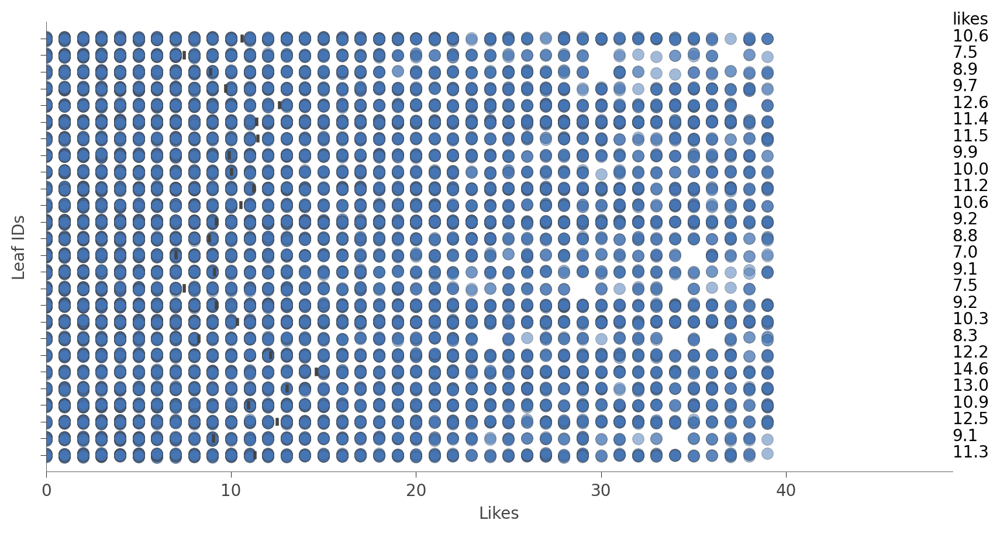

In [633]:
viz_model.rtree_leaf_distributions(figsize=(10,5))


In [634]:
v = viz_model.view(fancy=False) 
v.save("DtreeRegressorEngagement_NonFancy_cm120224.svg")

In [635]:
v = viz_model.view() 
v.save("DtreeRegressorEngagement_cm120224.svg")

In [35]:
# DTree (cont.)

In [36]:
new_dataset_url = "https://raw.githubusercontent.com/datajour-gr/iqjournalism/main/sample_data/koinonia_politiki_features_fb.csv"
dataset3 = pd.read_csv(new_dataset_url)

In [37]:
dataset3.tail()

,#title_words,Followers at Posting,Total Interactions,Likes,Comments,Shares,Love,Wow,Haha,Sad,...,animal,crime,caps_body,numbers,urls,sensual,special_char_ratio,strongsubjTitle,WeakSTitle,special_char_title
37546,16,298922.0,14,7.0,2.0,1.0,0.0,0.0,2.0,1.0,...,0,0,0,5,0,0,7.969152,2.570694,0.0,0.771208
37547,9,298922.0,88,51.0,19.0,2.0,1.0,0.0,7.0,0.0,...,0,0,0,0,0,0,12.345679,0.000000,0.0,1.234568
37548,15,298922.0,189,14.0,42.0,0.0,1.0,2.0,119.0,0.0,...,0,4,0,16,0,0,15.061058,1.356852,0.0,0.135685
37549,6,298922.0,3,3.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,1.984127,0.000000,0.0,0.396825
37550,13,298922.0,3,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,0,5.394191,0.000000,0.0,0.622407


In [38]:
dataset3.shape

(37551, 52)

In [39]:
dataset3 = dataset3.dropna()
dataset3.shape

(37051, 52)

In [40]:
dataset3.replace([np.inf, -np.inf], np.nan, inplace=True)
dataset3.dropna(inplace=True)

In [41]:
dataset3.columns

Index(['#title_words', 'Followers at Posting', 'Total Interactions', 'Likes',
       'Comments', 'Shares', 'Love', 'Wow', 'Haha', 'Sad', 'Angry', 'Care',
       'anger', 'anticipation', 'disgust', 'fear', 'joy', 'negative',
       'positive', 'sadness', 'surprise', 'trust', 'valence', 'arousal',
       'dominance', 'strongsubj', ' weaksubj', 'flesch_reading_ease',
       'flesch_kincaid_grade', 'mean_word_length', 'n_stop_words', 'sources',
       'length', 'MTLD', 'Nouns', 'Verbs', 'Adjectives', 'Anger_intensity',
       'Joy_intensity', 'Sadness_intensity', 'Fear_intensity', 'No Celebs',
       'animal', 'crime', 'caps_body', 'numbers', 'urls', 'sensual',
       'special_char_ratio', 'strongsubjTitle', 'WeakSTitle',
       'special_char_title'],
      dtype='object')

In [42]:
dataset3['Followers at Posting'].describe()

count     37051.000000
mean     487580.698686
std      120542.615795
min      170540.000000
25%      336666.000000
50%      558987.000000
75%      566871.000000
max      567465.000000
Name: Followers at Posting, dtype: float64

In [43]:
#dataset3['Total Interactions'] = dataset3['Total Interactions'].replace(',','', regex=True).astype(int)

In [44]:
dataset3['Total Interactions'].describe()

count    37051.000000
mean       104.402553
std        345.842449
min          0.000000
25%         11.000000
50%         30.000000
75%         85.500000
max      10976.000000
Name: Total Interactions, dtype: float64

In [45]:
dataset3['NormInteractions'] = (dataset3['Total Interactions'] / dataset3['Followers at Posting']) * 10000

In [46]:
dataset3['NormInteractions'].describe()

count    37051.000000
mean         2.368535
std          7.600810
min          0.000000
25%          0.211666
50%          0.634887
75%          1.900623
max        347.748700
Name: NormInteractions, dtype: float64

In [47]:
data_good = dataset3[(dataset3['NormInteractions'] >=2)]
data_good.shape

(8841, 53)

In [48]:
data_good['engagement'] = 1

In [49]:
data_bad = dataset3[dataset3['NormInteractions'] <=0.2] 
data_bad.shape

(8721, 53)

In [50]:
data_bad['engagement'] = 0

In [51]:
pdList = [data_bad, data_good]  # List of your dataframes
dataset3= pd.concat(pdList)

In [52]:
dataset3.shape

(17562, 54)

In [53]:
dataset3 = dataset3.reset_index(drop=True)


In [54]:
dataset3.drop([' weaksubj', 'flesch_reading_ease','n_stop_words','MTLD', 'Nouns', 'Verbs', 'WeakSTitle','Likes'],axis=1, inplace=True)

In [55]:
X_train,X_test,Y_train,Y_test = train_test_split(dataset3[features],dataset3["engagement"],test_size=0.20,random_state=0)

In [56]:
X_train.shape, X_test.shape

((14049, 33), (3513, 33))

In [57]:
X_train.columns

Index(['#title_words', 'anger', 'anticipation', 'disgust', 'fear', 'joy',
       'negative', 'positive', 'sadness', 'surprise', 'trust', 'valence',
       'arousal', 'dominance', 'strongsubj', 'flesch_kincaid_grade',
       'mean_word_length', 'sources', 'length', 'Adjectives',
       'Anger_intensity', 'Joy_intensity', 'Sadness_intensity',
       'Fear_intensity', 'No Celebs', 'animal', 'crime', 'caps_body',
       'numbers', 'urls', 'special_char_ratio', 'strongsubjTitle',
       'special_char_title'],
      dtype='object')

In [62]:
dt_model = DecisionTreeClassifier(max_depth=8, min_samples_split = 200, 
                                  min_samples_leaf= 100) #class_weight='balanced') # Set max_depth & class_weight 
dt_model.fit(X_train, Y_train)

Y_pred_dt = dt_model.predict(X_test)


In [63]:
score_dt = round(accuracy_score(Y_pred_dt,Y_test)*100,2)

print("The accuracy score achieved using DTrees is: "+str(score_dt)+" %")

The accuracy score achieved using DTrees is: 64.02 %


In [64]:
viz_model = dtreeviz.model(dt_model,
                           X_train=dataset3[features], y_train=dataset3[target],
                           feature_names=features,
                           target_name=target, class_names=["not engaging", "engaging"])

In [70]:
viz_model.view()

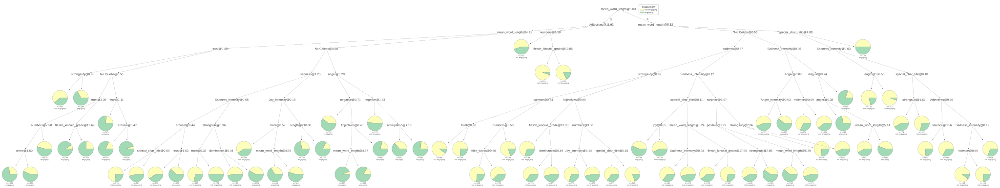

In [66]:
viz_model.view(fancy=False)

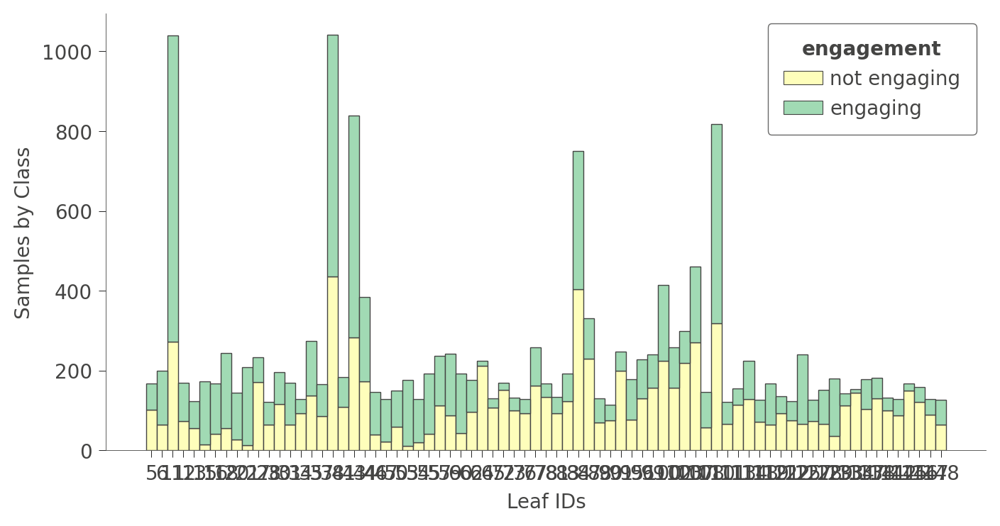

In [67]:
viz_model.ctree_leaf_distributions(figsize=(8,4))

In [68]:
v = viz_model.view(fancy=False) 
v.save("DtreeClassEngagement_NonFancy_NormalizationKs140224.svg")

In [71]:
v = viz_model.view() 
v.save("DtreeClassEngagement_NormalizationKs140224.svg")